# Introduction

In this notebook we will train our YOLOv8-based model to detect car lisence plates.
Ultralytics has done a huge amount of work to train their model in a plug-and-play manner comparing to old YOLOv5 versions.

There will be three steps:
* data pre-processing;
* model training;
* model evaluation on a test set.

Enjoy!

# Setting up a working environment

## Installing non-default libraries

For our future work we should use Ultralytics framework to our model being trained, evaluated and saved.

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 34.5 MB/s eta 0:00:00


## Importing all the necessary libraries

In [2]:
import os
import cv2
import yaml
import shutil
import numpy as np
import matplotlib.pyplot as plt

import torch
print(torch.cuda.is_available())

from ultralytics import YOLO

True
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Data exploring and pre-processing

## Getting directory tree structure

In [3]:
def list_directory_tree_with_os_walk(starting_directory):
    for root, directories, files in os.walk(starting_directory):
        print(f"Directory: {root}")
list_directory_tree_with_os_walk('/kaggle/input/large-license-plate-dataset')

Directory: /kaggle/input/large-license-plate-dataset
Directory: /kaggle/input/large-license-plate-dataset/labels
Directory: /kaggle/input/large-license-plate-dataset/labels/val
Directory: /kaggle/input/large-license-plate-dataset/labels/test
Directory: /kaggle/input/large-license-plate-dataset/labels/train
Directory: /kaggle/input/large-license-plate-dataset/images
Directory: /kaggle/input/large-license-plate-dataset/images/val
Directory: /kaggle/input/large-license-plate-dataset/images/test
Directory: /kaggle/input/large-license-plate-dataset/images/train


As we can see, the structure of the dataset is not similar to the one YOLO model needs to have for training. We need to fix it.

## Data pre-processing step

The main goal of this part is to change our directory structure to look like: <br>
*dataset/ <br>
&emsp;&emsp;train/<br>
&emsp;&emsp;&emsp;&emsp;labels/<br>
&emsp;&emsp;&emsp;&emsp;images/<br>
&emsp;&emsp;val/<br>
&emsp;&emsp;&emsp;&emsp;labels/<br>
&emsp;&emsp;&emsp;&emsp;images/<br>
&emsp;&emsp;test/<br>
&emsp;&emsp;&emsp;&emsp;labels/<br>
&emsp;&emsp;&emsp;&emsp;images/<br>*



In [4]:
shutil.copytree('/kaggle/input/large-license-plate-dataset/images/train/', '/kaggle/working/dataset/train/images')
shutil.copytree('/kaggle/input/large-license-plate-dataset/labels/train/', '/kaggle/working/dataset/train/labels')
shutil.copytree('/kaggle/input/large-license-plate-dataset/images/val/', '/kaggle/working/dataset/validation/images')
shutil.copytree('/kaggle/input/large-license-plate-dataset/labels/val/', '/kaggle/working/dataset/validation/labels')
shutil.copytree('/kaggle/input/large-license-plate-dataset/images/test/', '/kaggle/working/dataset/test/images')
shutil.copytree('/kaggle/input/large-license-plate-dataset/labels/test/', '/kaggle/working/dataset/test/labels')

'/kaggle/working/dataset/test/labels'

Lets check the tree structure now:

In [5]:
list_directory_tree_with_os_walk('/kaggle/working/dataset')

Directory: /kaggle/working/dataset
Directory: /kaggle/working/dataset/train
Directory: /kaggle/working/dataset/train/images
Directory: /kaggle/working/dataset/train/labels
Directory: /kaggle/working/dataset/test
Directory: /kaggle/working/dataset/test/images
Directory: /kaggle/working/dataset/test/labels
Directory: /kaggle/working/dataset/validation
Directory: /kaggle/working/dataset/validation/images
Directory: /kaggle/working/dataset/validation/labels


## Creating a config file for training

As well as an appropriate folder structure, we have to create a configuration file containing all information needed for training phase, such as: paths, class names etc.  <br>
It will look this way: <br>
`
path: sku_data/
train: 'train/images'
val: 'valid/images'`<br>
`# class names
names: 
  0: 'object'`

In [6]:
training_config = {"path": "/kaggle/working/dataset", "train":"train/images", "val": "validation/images", "test": "test/images", "names": {0: "license_plate"}}
with open('data.yaml', 'w') as yaml_file:
    yaml.dump(training_config, yaml_file, sort_keys=False)

## Data exploring
Let's plot some pictures from the training set with the ground-truth bounding boxes.

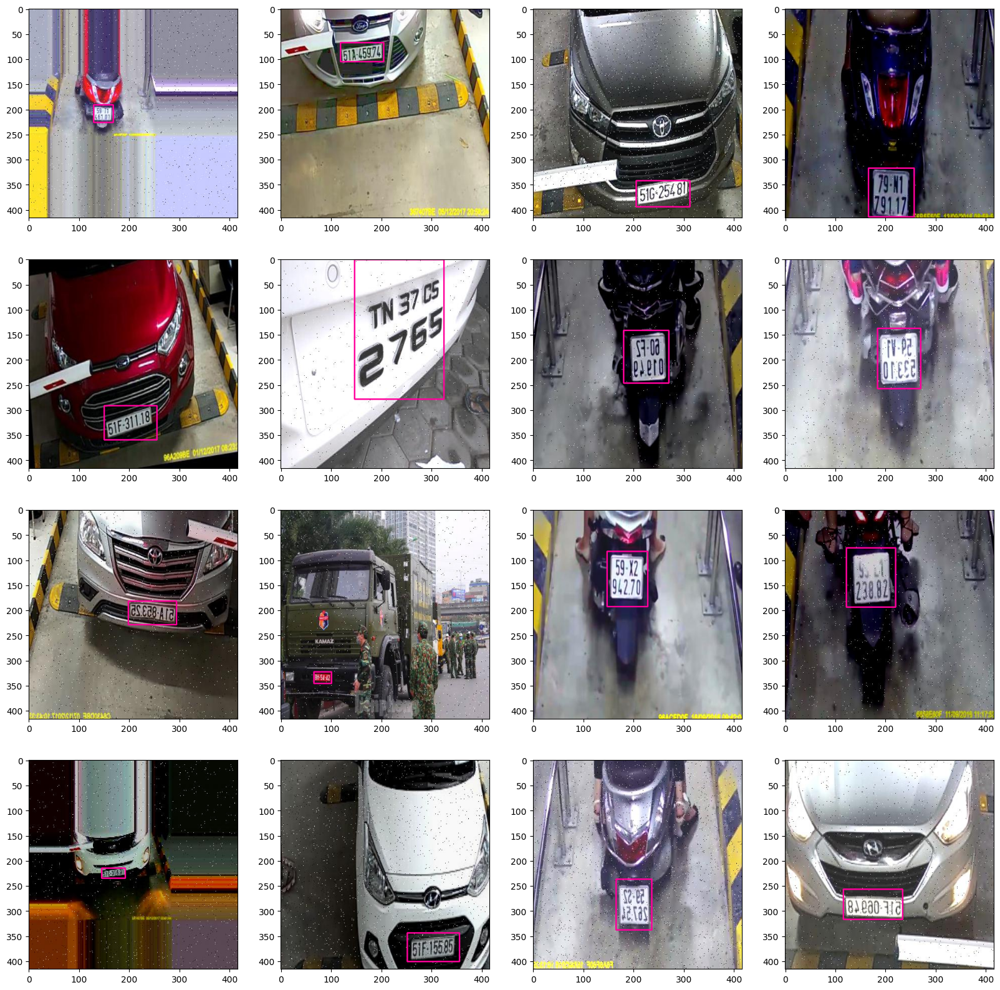

In [7]:
IMG_DATA = "/kaggle/working/dataset/{}/images"
LABELA_DATA = "/kaggle/working/dataset/{}/labels"

def preprocess_bbox(bbox_data, img_height, img_width):
    
    bbox_data = bbox_data.strip('\n')
    # class, bbox center x, bbox center y, h, w
    _, x, y, w, h = map(float, bbox_data.split(" "))
    x1 = int((x - w / 2) * img_width)
    x2 = int((x + w / 2) * img_width)
    y1 = int((y - h / 2) * img_height)
    y2 = int((y + h / 2) * img_height)
    
    return [x1, y1, x2, y2]   


def plot_labeled_data(mode='train'):

    fig = plt.figure(figsize=(20, 20)) 
    rows = 4
    columns = 4
    
    imgs_list = os.listdir(IMG_DATA.format(mode))
    labels_list = os.listdir(LABELA_DATA.format(mode))
    
    for i, img_name in enumerate(imgs_list[:16]):
        
        img = cv2.imread(os.path.join(IMG_DATA.format(mode), img_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_h, img_w, _ = img.shape
        
        fl = open(os.path.join(LABELA_DATA.format(mode), img_name[:-3] + 'txt'), 'r')
        data = fl.readlines()
        for d in data:
            bbox = preprocess_bbox(d, img_h, img_w)
            cv2.rectangle(img=img, pt1=(bbox[0], bbox[1]), pt2=(bbox[2], bbox[3]), color=(255, 0, 155), thickness=2)
        fl.close()
        fig.add_subplot(rows, columns, i+1) 
        plt.imshow(img)
    plt.show()
    
plot_labeled_data()

**As we can see, some augmentations have been already done.**

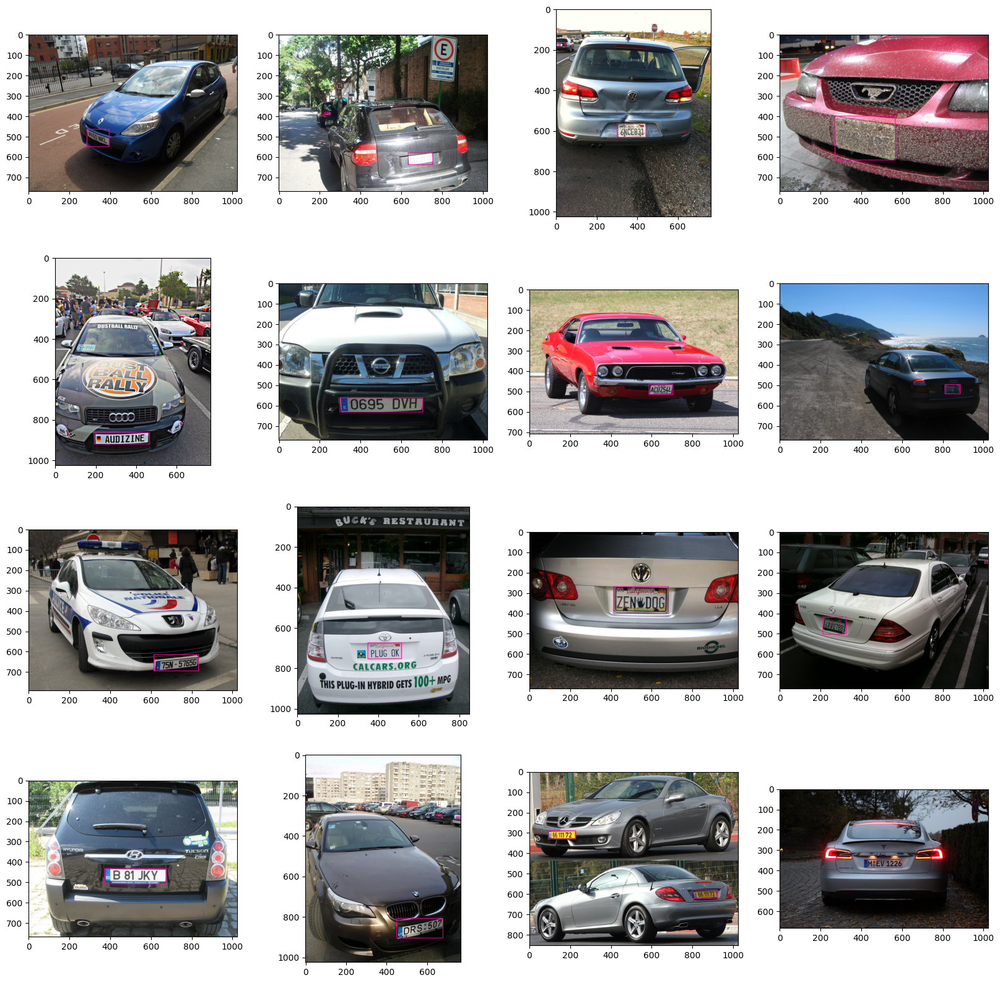

In [8]:
plot_labeled_data(mode='test')

# Model training

## Choosing an arctitecture
There are several types of YOLOv8 architectures. The difference is in the number of parameters each has. More details here: https://docs.ultralytics.com/tasks/detect/#models
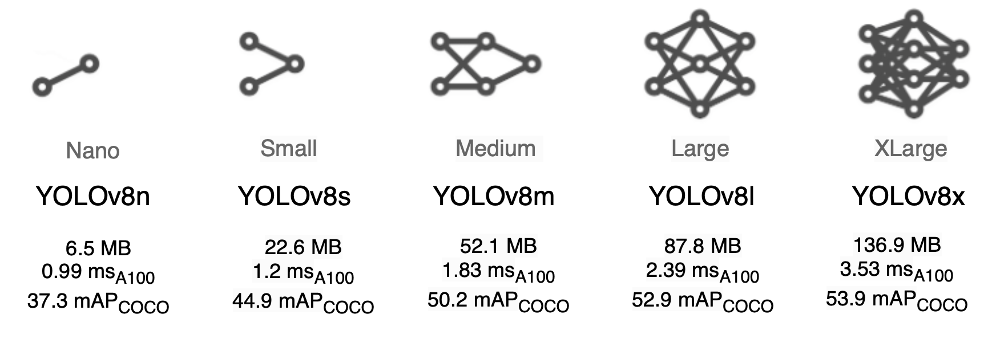

We wil use the smallest one, YOLOv8n, because of the inference time restriction.  

In [9]:
model = YOLO("yolov8n.pt")

## Training procedure

In [10]:
results = model.train(data="data.yaml", epochs=50, imgsz=640, patience=10)

Ultralytics 8.3.189 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile

2025-08-30 08:40:58,859	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-08-30 08:41:00,175	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

In [11]:
model.export(format="tflite")

Ultralytics 8.3.189 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (5.9 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0,<1.4.0', 'onnx2tf>=1.26.3', 'onnxslim>=0.1.65', 'onnxruntime-gpu', 'protobuf>=5'] not found, attempting AutoUpdate...


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have dill 0.3.8 which is incompatible.
apache-beam 2.46.0 requires numpy<1.25.0,>=1.14.3, but you have numpy 1.26.4 which is incompatible.
apache-beam 2.46.0 requires protobuf<4,>3.12.2, but you have protobuf 6.32.0 which is incompatible.
apache-beam 2.46.0 requires pyarrow<10.0.0,>=3.0.0, but you have pyarrow 16.1.0 which is incompatible.
google-ai-generativelanguage 0.6.6 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 6.32.0 which is incompatible.
google-api-core 2.11.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0.dev0,>=3.19.5, but you have prot

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.2/151.2 kB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.9/57.9 kB 259.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.3/468.3 kB 338.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.1/164.1 kB 283.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 283.2/283.2 MB 205.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.0/322.0 kB 314.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 268.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 238.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 221.7 MB/s eta 0:00:00
  Attempting uninstall: sympy
    Found existing installation: sympy 1.13.0
    Uninstalling sympy-1.13.0:
      Successfully 

Summary on the non-converted ops:
---------------------------------
 * Accepted dialects: tfl, builtin, func
 * Non-Converted Ops: 155, Total Ops 410, % non-converted = 37.80 %
 * 155 ARITH ops

- arith.constant:  155 occurrences  (f32: 131, i32: 24)



  (f32: 8)
  (f32: 18)
  (f32: 64)
  (f32: 58)
  (f32: 3)
  (f32: 59)
  (f32: 7)
  (f32: 6)
  (f32: 2)
  (f32: 1)
  (f32: 20)
  (f32: 2)
  (f32: 4)
Summary on the non-converted ops:
---------------------------------
 * Accepted dialects: tfl, builtin, func
 * Non-Converted Ops: 155, Total Ops 541, % non-converted = 28.65 %
 * 155 ARITH ops

- arith.constant:  155 occurrences  (f16: 131, i32: 24)



  (f32: 8)
  (f32: 18)
  (f32: 64)
  (f32: 131)
  (f32: 58)
  (f32: 3)
  (f32: 59)
  (f32: 7)
  (f32: 6)
  (f32: 2)
  (f32: 1)
  (f32: 20)
  (f32: 2)
  (f32: 4)


TensorFlow SavedModel: export success ✅ 97.1s, saved as 'runs/detect/train/weights/best_saved_model' (29.5 MB)

TensorFlow Lite: starting export with tensorflow 2.15.0...
TensorFlow Lite: export success ✅ 0.0s, saved as 'runs/detect/train/weights/best_saved_model/best_float32.tflite' (11.7 MB)

Export complete (97.5s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best_saved_model/best_float32.tflite imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best_saved_model/best_float32.tflite imgsz=640 data=data.yaml  
Visualize:       https://netron.app


'runs/detect/train/weights/best_saved_model/best_float32.tflite'

# Model evaluation

In this part we will exam how well-trained our model is in 3 steps:
* assess metrics during training on validation set
* evaluate model on test data
* plot predictions in test set

## Assess metrics during training on validation set

Using a handy service **wandb** we can exam our training and validation metrics.
As we can see, there is no overfitting according to validation loss graphs.

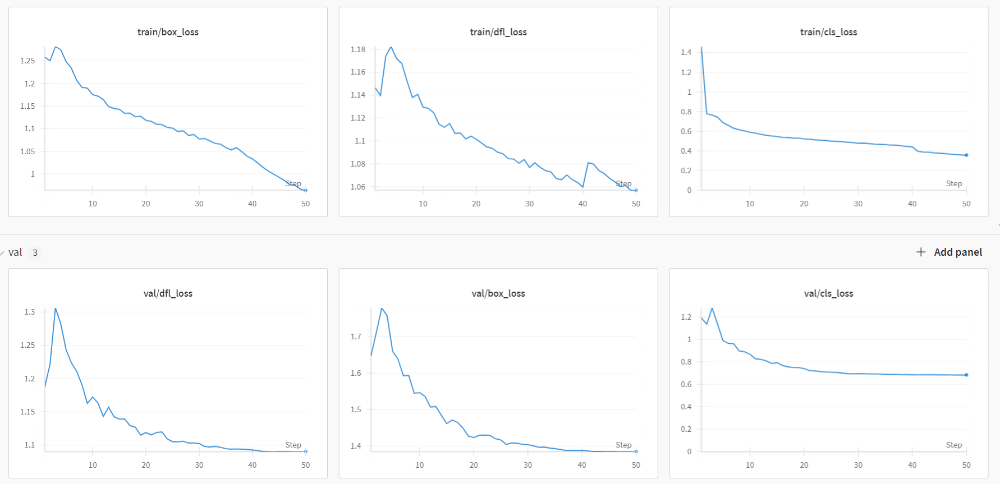

## Model evaluation on the test dataset
We will use `conf=0.15` and `iou=0.3` for inference.

In [12]:
metrics = model.val(data='data.yaml', split='test', conf=0.15, iou=0.3)

Ultralytics 8.3.189 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2945.4±811.8 MB/s, size: 313.2 KB)
val: Scanning /kaggle/working/dataset/test/labels... 386 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 386/386 1370.2it/s 0.3s
val: New cache created: /kaggle/working/dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 5.2it/s 4.8s
                   all        386        512      0.945      0.841      0.917      0.716
Speed: 0.3ms preprocess, 6.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train2


In [13]:
metrics.box.map,

(0.7161274735182316,)

## Plotting predictions

In [14]:
predicted = model.predict(source='/kaggle/working/dataset/test/images', conf=0.15, iou=0.3, classes=[0])


image 1/386 /kaggle/working/dataset/test/images/003a5aaf6d17c917.jpg: 448x640 1 license_plate, 48.9ms
image 2/386 /kaggle/working/dataset/test/images/00723dac8201a83e.jpg: 480x640 2 license_plates, 48.0ms
image 3/386 /kaggle/working/dataset/test/images/008637722500f239.jpg: 480x640 2 license_plates, 5.9ms
image 4/386 /kaggle/working/dataset/test/images/0170ea8e1a33375a.jpg: 448x640 2 license_plates, 6.1ms
image 5/386 /kaggle/working/dataset/test/images/017527da8bfeb97d.jpg: 448x640 1 license_plate, 5.2ms
image 6/386 /kaggle/working/dataset/test/images/02a6ef3d9bd68e91.jpg: 480x640 2 license_plates, 5.7ms
image 7/386 /kaggle/working/dataset/test/images/03b7b71e1ffcb7a8.jpg: 448x640 1 license_plate, 5.9ms
image 8/386 /kaggle/working/dataset/test/images/044417ca6134604f.jpg: 448x640 1 license_plate, 5.4ms
image 9/386 /kaggle/working/dataset/test/images/057569768fd6303e.jpg: 480x640 2 license_plates, 5.8ms
image 10/386 /kaggle/working/dataset/test/images/064a8def3049d040.jpg: 448x640 1 li

In [15]:
def preprocess_bbox(bbox, img_height, img_width):
    
    
    return [int(bbox[0]), int(bbox[1]), int(bbox[2]), int(bbox[3])]   


def plot_predicted_data(predicted):

    fig = plt.figure(figsize=(20, 20)) 
    rows = 4
    columns = 4
    
    
    for i, pred in enumerate(predicted):
        img_path = pred.path
        bboxes = pred.boxes.xyxy
        
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_h, img_w, _ = img.shape
        
        for bbox in bboxes:
            bbox = preprocess_bbox(bbox.tolist(), img_h, img_w)
            cv2.rectangle(img=img, pt1=(bbox[0], bbox[1]), pt2=(bbox[2], bbox[3]), color=(255, 0, 155), thickness=2)
        fig.add_subplot(rows, columns, i+1) 
        plt.imshow(img)
    plt.show()  
        

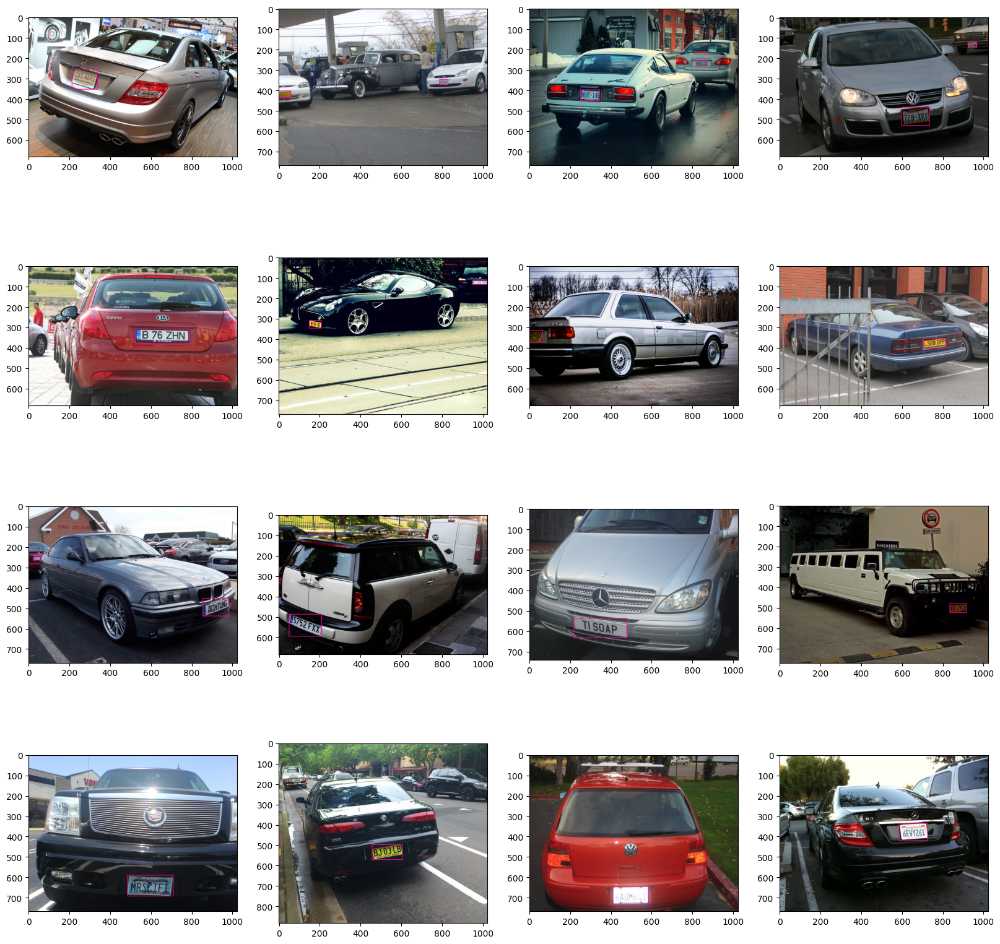

In [16]:
plot_predicted_data(predicted[:16])

# Conclusion
That was a trainig procedure for YOLOv8-based model.
Model's perfomance can be improved at least my changing the net's architecture, size of dataset, etc.